# 나만의 이미지 분류기 만들어보기

## 데이터셋 내려받기

- `tensorflow_datasets` 에 포함된 tf_flowers 데이터를 사용한다.   
    - tf_flowers 데이터에 대한 정보는 [다음](https://www.tensorflow.org/datasets/catalog/tf_flowers?hl=ko)에서 확인해볼 수 있다.
- tfds.load를 활용하여 데이터셋 다운

### 필요한 라이브러리 불러오기

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

### tf_flowers 데이터셋 다운로드

In [2]:
(train_dataset, validation_dataset, test_dataset), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    as_supervised=True,  # 데이터를 (img, label) 쌍으로 가져옴
    with_info=True,      # 데이터셋 정보 포함
)

print(metadata)

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/aiffel/tensorflow_datasets/tf_flowers/3.0.1',
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)


In [3]:
print(train_dataset)
print(validation_dataset)
print(test_dataset)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


## 데이터셋을 모델에 넣을 수 있는 형태로 준비하기
이미지를 모두 같은 크기로 formatting 한 후, `train_batches`, `validation_batches`, `test_batches`를 준비

### 데이터 시각화

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

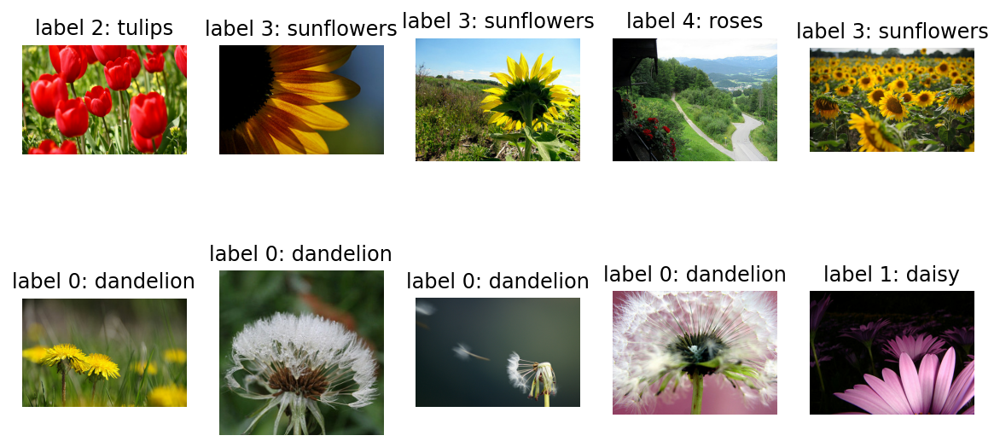

In [5]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train_dataset.take(10)):  # 10개의 데이터 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 모델에 입력할 수 있는 형태로 전처리하기
format_example() 함수를 이용해 이미지를 같은 포맷으로 통일

아래 코드는 이미지의 사이즈를 160x160 픽셀로 통일시킬 뿐만 아니라, 각 픽셀값의 scale을 수정해주는 역할도 한다.
- 타입캐스팅(Type Casting): 다른 데이터 타입으로 형(타입)을 바꿔주는 것 == 형변환
    - 정수형을 실수형으로 바꾸기 위해 float()를 사용하는 것이 타입캐스팅의 한 예이다.

#### preprocess 함수
- 이미지를 [224, 224] 크기로 리사이징하고, 픽셀 값을 [0, 1] 범위로 정규화한다.
- 이 방식은 주로 네트워크의 입력 크기가 224x224인 경우에 사용된다. 
    - 예를 들어, VGGNet, ResNet과 같은 일반적인 CNN 아키텍처에서 사용되는 표준 크기이다.
- 픽셀 값의 정규화는 모델 학습을 안정화시키고 더 빠른 수렴을 도울 수 있다.

In [6]:
def preprocess(image, label):
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0  # 이미지를 [0, 1] 범위로 정규화
    return image, label

BATCH_SIZE = 32

In [7]:
# 데이터셋 전처리
train = train_dataset.map(preprocess).batch(BATCH_SIZE).prefetch(1)
validation = validation_dataset.map(preprocess).batch(BATCH_SIZE).prefetch(1)
test = test_dataset.map(preprocess).batch(BATCH_SIZE).prefetch(1)

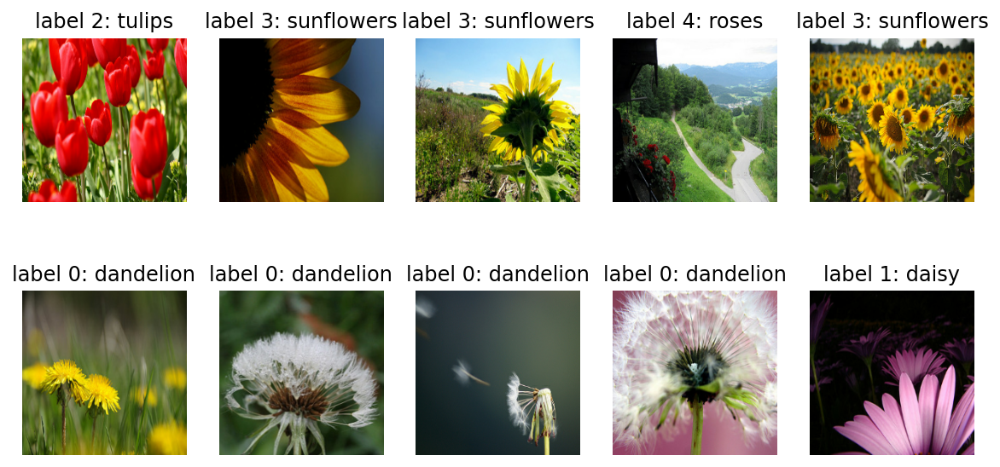

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (images, labels) in enumerate(train.take(1)):  # 1번째 배치만 가져옴
    for i in range(10):  # 배치의 처음 10개 이미지 시각화
        plt.subplot(2, 5, i+1)
        image = images[i]  # 배치에서 이미지 선택
        label = labels[i]  # 배치에서 레이블 선택
        plt.imshow(image)  # 이미지 정규화 과정을 이미 적용했으므로 추가 변환 불필요
        plt.title(f'label {label}: {get_label_name(label)}')
        plt.axis('off')

## 모델 설계하기
tf_flowers 데이터셋에는 5개의 클래스가 있으니, 최종 출력 레이어의 유닛 수를 5로 설정

### VGG16

#### VGG16 모델 로드

In [9]:
base_model = tf.keras.applications.VGG16(input_shape=(224, 224, 3),
                                         include_top=False,
                                         weights='imagenet')

#### 기본 모델의 파라미터를 고정

In [10]:
base_model.trainable = False

#### 모델 구성

- GlobalAveragePooling2D
   - 컨볼루션 신경망(CNN)에서 사용되는 한 종류의 풀링 레이어
   - 특징 맵(feature map)의 전역 평균을 계산하여 각 특징 맵에 대해 단일 숫자 출력
   - 이 레이어는 일반적으로 CNN의 마지막 컨볼루션 레이어 다음에 위치하여,고차원 특징 맵을 간소화된 형태로 압축하며, 모델의 파라미터 수와 연산량을 크게 줄여준다.



In [11]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(5, activation='softmax')  # 클래스가 5개이므로 출력층의 유닛 수를 5로 설정
])

#### 모델 컴파일

In [12]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

#### 모델 요약 출력

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               65664     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 645       
Total params: 14,780,997
Trainable params: 66,309
Non-trainable params: 14,714,688
_________________________________________________________________


## 모델 학습시키기

- 모델 학습
    - 단, 여기에서는 여러 가지 옵션을 바꿔볼 수 있다.
        - 예를 들어, 모델 학습을 10 epoch보다 더 많이 시켜보거나, learning_rate 값을 바꿔볼 수 있다.
        - 또는, optimizer의 종류도 바꿔볼 수 있다. 바꿔보고 싶다면, [여기](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers) 참고
    - VGG16이 아닌 다른 모델을 base model로 활용할 수도 있을 것이다. 
    - 파인튜닝을 fc layer의 구성에 변화를 줄 수 있을지도 모른다.
- Regularization 기법, Dropout이나 Batch Normalization을 적용

In [14]:
from tensorflow.keras.callbacks import EarlyStopping

# EarlyStopping 콜백 설정
early_stopping = EarlyStopping(
    monitor='val_loss',        # 성능을 모니터링할 지표
    patience=10,               # 성능 개선이 없는 epoch를 몇 번이나 허용할 것인지
    verbose=1,                 # 얼리 스탑이 발생했을 때 로그를 출력
    restore_best_weights=True  # 가장 좋은 모델의 가중치를 복원할지 여부
)

In [15]:
from tensorflow.keras.callbacks import ModelCheckpoint

# 체크포인트 설정
checkpoint_cb = ModelCheckpoint('aiffel/image_classification/best_vgg16.h5',
                                save_best_only=True,  # 가장 좋은 모델만 저장
                                monitor='val_loss',   # 모니터링할 값
                                verbose=1)            # 로그 출력

In [16]:
history = model.fit(
    train,
    epochs=100,
    validation_data=validation,
    callbacks=[early_stopping, checkpoint_cb]
)

Epoch 1/100
92/92 [==============================] - 31s 236ms/step - loss: 1.1427 - accuracy: 0.5749 - val_loss: 0.8310 - val_accuracy: 0.7330

Epoch 00001: val_loss improved from inf to 0.83096, saving model to aiffel/image_classification/best_vgg16.h5
Epoch 2/100
92/92 [==============================] - 13s 142ms/step - loss: 0.7806 - accuracy: 0.7231 - val_loss: 0.6921 - val_accuracy: 0.7629

Epoch 00002: val_loss improved from 0.83096 to 0.69213, saving model to aiffel/image_classification/best_vgg16.h5
Epoch 3/100
92/92 [==============================] - 13s 139ms/step - loss: 0.6561 - accuracy: 0.7745 - val_loss: 0.6215 - val_accuracy: 0.7820

Epoch 00003: val_loss improved from 0.69213 to 0.62153, saving model to aiffel/image_classification/best_vgg16.h5
Epoch 4/100
92/92 [==============================] - 13s 138ms/step - loss: 0.5970 - accuracy: 0.8011 - val_loss: 0.5844 - val_accuracy: 0.7956

Epoch 00004: val_loss improved from 0.62153 to 0.58440, saving model to aiffel/ima

## 모델 성능 평가하기
- 모델 학습이 완료되었다면, 모델의 성능을 평가할 차례
- 모델이 학습된 과정을 그래프로도 그려보고, validation_batches나 test_batches에 있는 데이터에 대한 예측 결과 확인

### 학습 과정 시각화

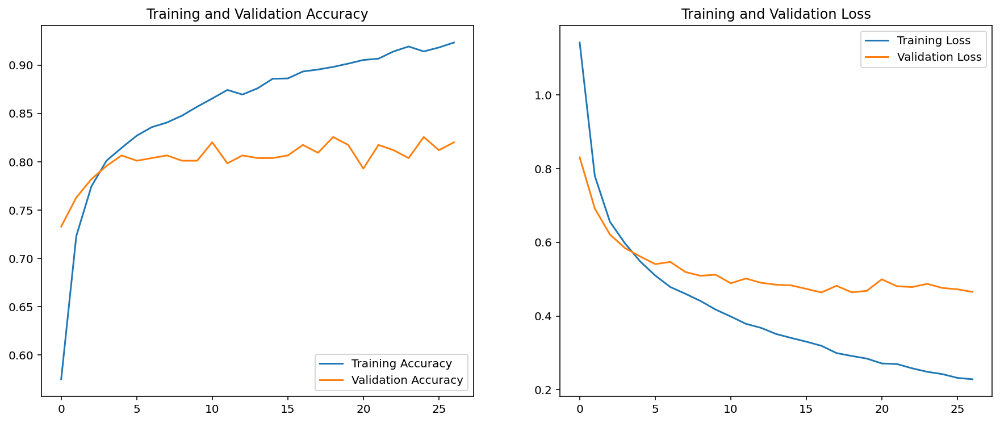

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### 테스트 데이터셋으로 모델 성능 평가

In [18]:
test_loss, test_accuracy = model.evaluate(test)
print(f'\nTest accuracy: {test_accuracy}')

12/12 [==============================] - 2s 117ms/step - loss: 0.3601 - accuracy: 0.8692

Test accuracy: 0.8692098259925842


In [19]:
for image_batch, label_batch in test.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[1.82497911e-02, 1.13053061e-01, 6.75254881e-01, 5.27571589e-02,
        1.40685081e-01],
       [9.99918222e-01, 7.08366206e-05, 2.23914526e-06, 4.78054835e-06,
        3.89041816e-06],
       [7.77270913e-01, 8.83132741e-02, 6.07870100e-03, 1.22622296e-01,
        5.71473176e-03],
       [1.14927148e-04, 5.89645118e-04, 8.06371033e-01, 1.15129491e-03,
        1.91772997e-01],
       [9.73024070e-01, 2.32779831e-02, 1.05126086e-03, 1.12644630e-03,
        1.52016233e-03],
       [9.95577097e-01, 1.18737866e-03, 2.09735037e-04, 2.78765894e-03,
        2.38066059e-04],
       [1.11863002e-01, 2.28987336e-01, 2.00971678e-01, 4.42190841e-02,
        4.13958848e-01],
       [8.56338814e-02, 7.64449537e-01, 5.12479746e-04, 1.47741199e-01,
        1.66284631e-03],
       [1.48272072e-03, 3.26350157e-04, 6.09386433e-03, 9.68553603e-01,
        2.35434901e-02],
       [9.99571860e-01, 4.12025402e-04, 1.48489005e-06, 1.27814192e-05,
        1.73176932e-06],
       [9.89141107e-01, 7.8048

In [20]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 4, 1, 3, 0, 0, 3, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 1, 4, 4, 3, 0, 4])

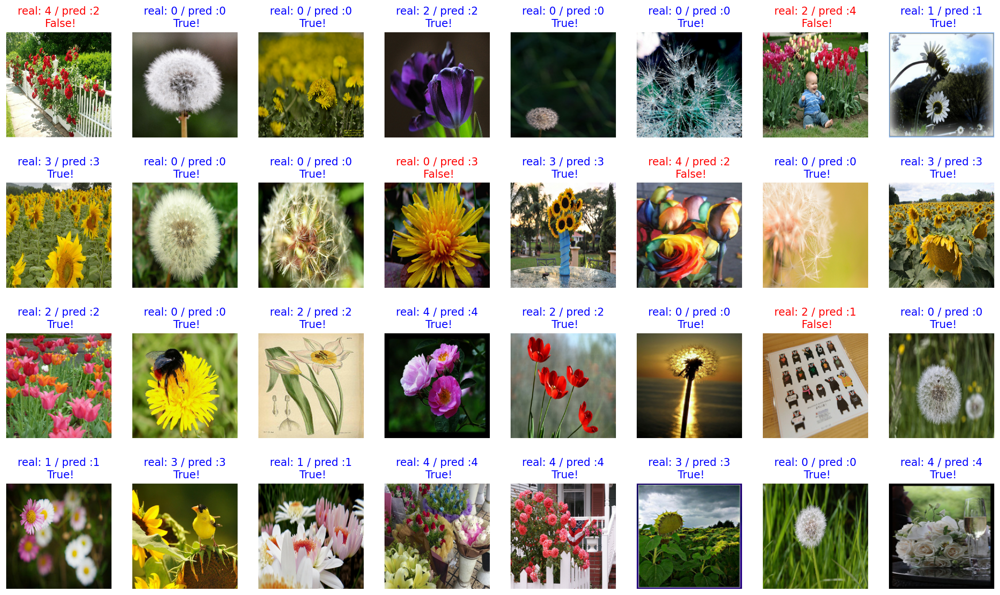

In [21]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [22]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)

84.375


## 모델 개선하기

### Dense Layer / Optimizer modifications

In [23]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(5, activation='softmax')  # 클래스가 5개이므로 출력층의 유닛 수를 5로 설정
])

In [24]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [25]:
history = model.fit(
    train,
    epochs=100,
    validation_data=validation,
    callbacks=[early_stopping, checkpoint_cb]
)

Epoch 1/100
92/92 [==============================] - 13s 140ms/step - loss: 1.3624 - accuracy: 0.4969 - val_loss: 1.1618 - val_accuracy: 0.6567

Epoch 00001: val_loss did not improve from 0.46399
Epoch 2/100
92/92 [==============================] - 13s 139ms/step - loss: 1.0767 - accuracy: 0.6509 - val_loss: 0.9654 - val_accuracy: 0.6894

Epoch 00002: val_loss did not improve from 0.46399
Epoch 3/100
92/92 [==============================] - 13s 139ms/step - loss: 0.9253 - accuracy: 0.6928 - val_loss: 0.8539 - val_accuracy: 0.7139

Epoch 00003: val_loss did not improve from 0.46399
Epoch 4/100
92/92 [==============================] - 13s 140ms/step - loss: 0.8247 - accuracy: 0.7296 - val_loss: 0.7858 - val_accuracy: 0.7166

Epoch 00004: val_loss did not improve from 0.46399
Epoch 5/100
92/92 [==============================] - 13s 139ms/step - loss: 0.7573 - accuracy: 0.7503 - val_loss: 0.7356 - val_accuracy: 0.7439

Epoch 00005: val_loss did not improve from 0.46399
Epoch 6/100
92/92 [=

- 성능 평가

In [26]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 0.4286 - accuracy: 0.8420WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 2s 83ms/step - loss: 0.4286 - accuracy: 0.8420
initial loss: 0.43
initial accuracy: 0.84


In [27]:
test_loss, test_accuracy = model.evaluate(test)
print(f'\nTest accuracy: {test_accuracy}')

12/12 [==============================] - 1s 118ms/step - loss: 0.3489 - accuracy: 0.8719

Test accuracy: 0.8719345927238464


In [28]:
for image_batch, label_batch in test.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[1.54579254e-02, 9.92899686e-02, 7.99179375e-01, 1.36116035e-02,
        7.24611357e-02],
       [9.99988198e-01, 1.08218010e-05, 2.92377592e-07, 3.34863643e-07,
        3.32356905e-07],
       [8.79338622e-01, 4.68157083e-02, 8.94698128e-03, 6.29787594e-02,
        1.92000077e-03],
       [8.09732410e-06, 1.22351732e-04, 9.19579983e-01, 6.49841750e-05,
        8.02246034e-02],
       [9.85127270e-01, 1.34431329e-02, 8.74227961e-04, 3.02543602e-04,
        2.52666068e-04],
       [9.98252332e-01, 1.59007948e-04, 1.04299143e-04, 1.37287052e-03,
        1.11541434e-04],
       [1.09393887e-01, 1.41611993e-01, 2.09457338e-01, 5.88559499e-03,
        5.33651173e-01],
       [1.81675956e-01, 6.60623312e-01, 7.51807587e-04, 1.55311108e-01,
        1.63781829e-03],
       [3.17405618e-04, 3.62710452e-05, 2.64162128e-03, 9.91293252e-01,
        5.71149029e-03],
       [9.99904633e-01, 9.32313051e-05, 2.26262301e-07, 1.78869197e-06,
        1.40869943e-07],
       [9.94024932e-01, 3.9628

In [29]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 4, 1, 3, 0, 0, 0, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 1, 4, 4, 3, 0, 4])

In [31]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)

87.5


### VGG16 Fine-tuning
- 전이 학습(Transfer Learning)에 미세 조정(Fine-tuning)을 적용하는 것은 사전에 훈련된 모델을 가져와서 마지막 몇 개의 합성곱 레이어를 우리의 특정 문제에 맞게 추가로 학습시키는 과정
- 미세 조정을 통해 모델이 특정 데이터셋의 세부적인 특징을 더 잘 학습할 수 있다

In [32]:
# 사전에 훈련된 모델 로드 (여기서는 VGG16 모델을 사용)
base_model = tf.keras.applications.VGG16(input_shape=(224, 224, 3),
                                         include_top=False,
                                         weights='imagenet')

# 기본 모델의 모든 레이어를 동결
base_model.trainable = False

# 미세 조정을 위해 마지막 몇 개의 레이어를 훈련 가능하게 설정
base_model.trainable = True
fine_tune_at = -4  # 마지막 4개의 레이어를 훈련 가능하게 설정

# 훈련 가능하게 설정할 레이어 이전의 모든 레이어를 동결
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# 모델 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # 낮은 학습률 사용
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# 모델 학습
history = model.fit(train,
                    epochs=100,
                    validation_data=validation,
                    callbacks=[early_stopping, checkpoint_cb])

Epoch 1/100


/opt/conda/lib/python3.9/site-packages/keras/backend.py:4906: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"


92/92 [==============================] - 13s 139ms/step - loss: 0.2135 - accuracy: 0.9377 - val_loss: 0.4335 - val_accuracy: 0.8392

Epoch 00001: val_loss did not improve from 0.42864
Epoch 2/100
92/92 [==============================] - 13s 141ms/step - loss: 0.2107 - accuracy: 0.9349 - val_loss: 0.4335 - val_accuracy: 0.8392

Epoch 00002: val_loss did not improve from 0.42864
Epoch 3/100
92/92 [==============================] - 13s 142ms/step - loss: 0.2135 - accuracy: 0.9360 - val_loss: 0.4330 - val_accuracy: 0.8392

Epoch 00003: val_loss did not improve from 0.42864
Epoch 4/100
92/92 [==============================] - 13s 140ms/step - loss: 0.2127 - accuracy: 0.9326 - val_loss: 0.4332 - val_accuracy: 0.8392

Epoch 00004: val_loss did not improve from 0.42864
Epoch 5/100
92/92 [==============================] - 13s 138ms/step - loss: 0.2081 - accuracy: 0.9380 - val_loss: 0.4339 - val_accuracy: 0.8392

Epoch 00005: val_loss did not improve from 0.42864
Epoch 6/100
92/92 [=============

- 성능평가

In [33]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 0.4329 - accuracy: 0.8392WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 1s 69ms/step - loss: 0.4329 - accuracy: 0.8392
initial loss: 0.43
initial accuracy: 0.84


In [34]:
test_loss, test_accuracy = model.evaluate(test)
print(f'\nTest accuracy: {test_accuracy}')

12/12 [==============================] - 1s 119ms/step - loss: 0.3436 - accuracy: 0.8692

Test accuracy: 0.8692098259925842


### MobileNetV2
상대적으로 가벼우면서도 높은 성능을 낼 수 있는 모델로, 특히 모바일과 임베디드 장치를 대상으로 설계되었다.

#### MobileNetV2 모델 로드

In [37]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')

# 기본 모델의 모든 레이어 동결
base_model.trainable = False

#### 모델 구축

In [38]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(5, activation='softmax')  # tf_flowers 데이터셋의 클래스 개수는 5개입니다.
])

#### 모델 컴파일

In [39]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

#### 모델 학습

In [40]:
checkpoint_cb = ModelCheckpoint('aiffel/image_classification/best_mobilenet.h5',
                                save_best_only=True,  # 가장 좋은 모델만 저장
                                monitor='val_loss',   # 모니터링할 값
                                verbose=1)            # 로그 출력

In [41]:
history = model.fit(train,
                    epochs=100,
                    validation_data=validation,
                    callbacks=[early_stopping, checkpoint_cb])

Epoch 1/100
92/92 [==============================] - 8s 57ms/step - loss: 0.5942 - accuracy: 0.7994 - val_loss: 0.3199 - val_accuracy: 0.8883

Epoch 00001: val_loss improved from inf to 0.31995, saving model to aiffel/image_classification/best_mobilenet.h5


/opt/conda/lib/python3.9/site-packages/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.


Epoch 2/100
92/92 [==============================] - 4s 42ms/step - loss: 0.2644 - accuracy: 0.9029 - val_loss: 0.2926 - val_accuracy: 0.8937

Epoch 00002: val_loss improved from 0.31995 to 0.29260, saving model to aiffel/image_classification/best_mobilenet.h5
Epoch 3/100
92/92 [==============================] - 4s 42ms/step - loss: 0.1761 - accuracy: 0.9373 - val_loss: 0.4011 - val_accuracy: 0.8774

Epoch 00003: val_loss did not improve from 0.29260
Epoch 4/100
92/92 [==============================] - 4s 42ms/step - loss: 0.1274 - accuracy: 0.9557 - val_loss: 0.4004 - val_accuracy: 0.8883

Epoch 00004: val_loss did not improve from 0.29260
Epoch 5/100
92/92 [==============================] - 4s 42ms/step - loss: 0.0878 - accuracy: 0.9728 - val_loss: 0.4578 - val_accuracy: 0.8856

Epoch 00005: val_loss did not improve from 0.29260
Epoch 6/100
92/92 [==============================] - 4s 42ms/step - loss: 0.0551 - accuracy: 0.9816 - val_loss: 0.3757 - val_accuracy: 0.8992

Epoch 00006: v

#### 모델 성능 평가

In [42]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.2952 - accuracy: 0.8920WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 0s 20ms/step - loss: 0.2926 - accuracy: 0.8937
initial loss: 0.29
initial accuracy: 0.89


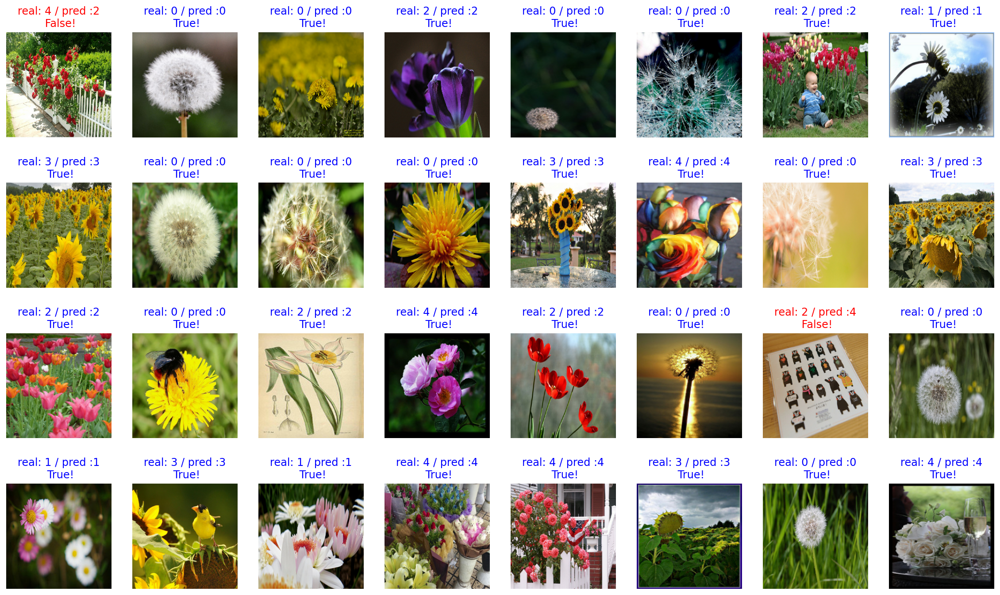

In [43]:
for image_batch, label_batch in test.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions = np.argmax(predictions, axis=1)

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [44]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)

93.75


#### MobileNetV2 Fine-Tuning

```Python
# 특정 레이어 이후의 모든 레이어를 훈련 가능하게 설정
base_model.trainable = True
fine_tune_at = 100  # 100번째 레이어 이후를 훈련 가능하게 설정

# 해당 레이어 이전의 레이어 동결
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# 매우 낮은 학습률로 모델 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 미세 조정 학습 진행
history_fine = model.fit(train,
                         epochs=100,
                         validation_data=validation,
                         callbacks=[early_stopping])
```

여러번 돌릴 예정이기 때문에 초기 설정값을 마크다운으로 표시해둠

**result**
1. fine_tune_at(100) = count(87.5)
2. fine_tune_at(200) = count(90.625)
3. fine_tune_at(300) = count(87.5) ?
4. fine_tune_at(200) = count(87.5)

In [45]:
# 특정 레이어 이후의 모든 레이어를 훈련 가능하게 설정
base_model.trainable = True
fine_tune_at = 200

# 해당 레이어 이전의 레이어 동결
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# 매우 낮은 학습률로 모델 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 미세 조정 학습 진행
history_fine = model.fit(train,
                         epochs=100,
                         validation_data=validation,
                         callbacks=[early_stopping, checkpoint_cb])

Epoch 1/100
92/92 [==============================] - 7s 49ms/step - loss: 0.1285 - accuracy: 0.9656 - val_loss: 0.2753 - val_accuracy: 0.9128

Epoch 00001: val_loss improved from 0.29260 to 0.27528, saving model to aiffel/image_classification/best_mobilenet.h5
Epoch 2/100
92/92 [==============================] - 4s 41ms/step - loss: 0.1164 - accuracy: 0.9666 - val_loss: 0.2739 - val_accuracy: 0.9128

Epoch 00002: val_loss improved from 0.27528 to 0.27394, saving model to aiffel/image_classification/best_mobilenet.h5
Epoch 3/100
92/92 [==============================] - 4s 41ms/step - loss: 0.1110 - accuracy: 0.9704 - val_loss: 0.2729 - val_accuracy: 0.9183

Epoch 00003: val_loss improved from 0.27394 to 0.27292, saving model to aiffel/image_classification/best_mobilenet.h5
Epoch 4/100
92/92 [==============================] - 4s 42ms/step - loss: 0.1039 - accuracy: 0.9728 - val_loss: 0.2727 - val_accuracy: 0.9210

Epoch 00004: val_loss improved from 0.27292 to 0.27270, saving model to ai

- 성능 평가

In [46]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.2764 - accuracy: 0.9205WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 0s 20ms/step - loss: 0.2724 - accuracy: 0.9237
initial loss: 0.27
initial accuracy: 0.92


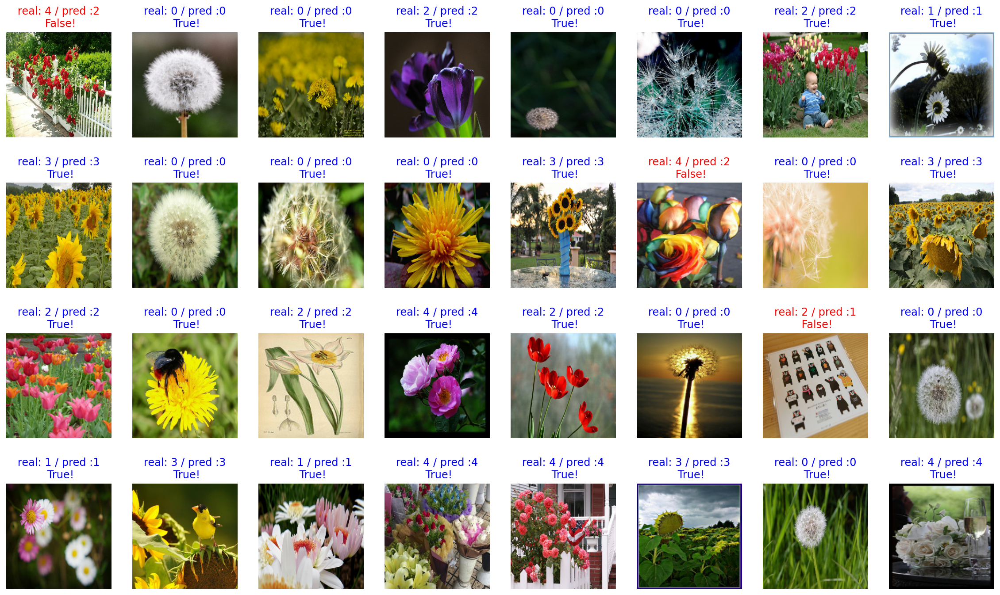

In [47]:
for image_batch, label_batch in test.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions = np.argmax(predictions, axis=1)

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [48]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)

90.625


## 모델 활용하기
- 모델이 꽤나 똑똑해졌다면, 이제 활용해볼 수 있다.
- 원하는 이미지를 자유롭게 모델에 입력해 보고, 어떤 예측 결과를 내는지 확인

In [49]:
from PIL import Image
import requests
from io import BytesIO

Predicted class: sunflowers


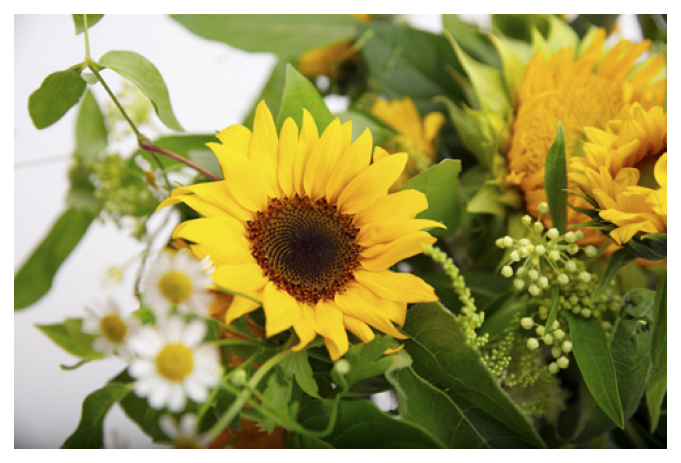

In [59]:
# 클래스 라벨 정의
class_names = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

# 이미지 로드 및 전처리 함수
def load_and_preprocess_image(image_url, target_size=(224, 224)):
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    image = image.resize(target_size)
    image = np.array(image)
    image = image / 255.0  # [0, 1] 범위로 스케일링
    image = np.expand_dims(image, axis=0)  # 배치 차원 추가
    return image

# 예측 함수 (클래스 이름으로 예측 결과 반환)
def predict_image(image_url):
    preprocessed_image = load_and_preprocess_image(image_url)
    predictions = model.predict(preprocessed_image)
    predicted_class_index = np.argmax(predictions[0], axis=-1)
    predicted_class_name = class_names[predicted_class_index]
    return predicted_class_name

# 이미지 URL
image_url = 'https://cdn.nongupin.co.kr/news/photo/201905/63937_42522_2637.jpg'

# 모델을 사용하여 예측
predicted_class_name = predict_image(image_url)

# 예측 결과 출력
print(f'Predicted class: {predicted_class_name}')

# 원본 이미지 출력
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))
plt.imshow(img)
plt.axis('off')  # 축 정보 끄기
plt.show()

## 회고
어려운 프로젝트가 아니라서 다행이였던 거 같다.  
다만 이것저것 실행하다보니 파일이 깃허브에 올리기에는 무거워져서  
조금 삭제한 부분도 꽤나 있어서 아쉽다.  

뭔가 그라디오로 나타내고 싶은데 자꾸 에러가 떠서 함수도 잘 실행되는데  
뭐가 문제인지 몰라서 일단 올려보고 생각해볼 예정이다..!  

음..성능이 안나왔다면 여기서 시간 더 걸렸겠지만 다행이다!! 